In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score,confusion_matrix,roc_auc_score,roc_curve,auc

In [2]:
import paho.mqtt.client as mqtt

In [3]:
import warnings 
warnings.filterwarnings('ignore')

In [4]:
plt.rcParams['font.family']='Times New Roman'

## Simulating Heart Disease Data from IOT

In [6]:
import paho.mqtt.client as mqtt
import pandas as pd
import numpy as np
import json
import time
import os
from datetime import datetime  # ⏰ Import datetime for timestamps

# MQTT Broker Details
BROKER = "test.mosquitto.org"
TOPIC = "iot/heart_disease"

# Path to your dataset
DATASET_PATH = "Datasets/heart_statlog_cleveland_hungary_final.csv"
CSV_FILE = "published_heart_data.csv"  # Where you log published data

# Load dataset
df = pd.read_csv(DATASET_PATH)
NUM_RECORDS = len(df)

# MQTT Client
client = mqtt.Client()
client.connect(BROKER, 1883, 60)

# Publish data & save to CSV
try:
    for i in range(NUM_RECORDS):
        record = df.iloc[i].to_dict()  # Convert row to dictionary
        timestamp = datetime.now().strftime("%Y-%m-%d %H:%M:%S")  # 🕒 Current time

        # Include timestamp in record
        record_with_time = record.copy()
        record_with_time["timestamp"] = timestamp

        # Publish to MQTT
        client.publish(TOPIC, json.dumps(record_with_time))

        # Append to CSV with timestamp
        pd.DataFrame([record_with_time]).to_csv(CSV_FILE, mode='a', header=not os.path.exists(CSV_FILE), index=False)

        print(f"[{timestamp}] Published {i+1}/{NUM_RECORDS}: {record}")

        time.sleep(0.1)  # Simulate real-time data

    print(f"\n✅ {NUM_RECORDS} heart disease records published!")
except KeyboardInterrupt:
    print("\n❌ Stopping Publisher")
finally:
    client.disconnect()


[2025-04-07 11:26:29] Published 1/1190: {'age': 40.0, 'sex': 1.0, 'chest pain type': 2.0, 'resting bp s': 140.0, 'cholesterol': 289.0, 'fasting blood sugar': 0.0, 'resting ecg': 0.0, 'max heart rate': 172.0, 'exercise angina': 0.0, 'oldpeak': 0.0, 'ST slope': 1.0, 'target': 0.0}
[2025-04-07 11:26:29] Published 2/1190: {'age': 49.0, 'sex': 0.0, 'chest pain type': 3.0, 'resting bp s': 160.0, 'cholesterol': 180.0, 'fasting blood sugar': 0.0, 'resting ecg': 0.0, 'max heart rate': 156.0, 'exercise angina': 0.0, 'oldpeak': 1.0, 'ST slope': 2.0, 'target': 1.0}
[2025-04-07 11:26:29] Published 3/1190: {'age': 37.0, 'sex': 1.0, 'chest pain type': 2.0, 'resting bp s': 130.0, 'cholesterol': 283.0, 'fasting blood sugar': 0.0, 'resting ecg': 1.0, 'max heart rate': 98.0, 'exercise angina': 0.0, 'oldpeak': 0.0, 'ST slope': 1.0, 'target': 0.0}
[2025-04-07 11:26:29] Published 4/1190: {'age': 48.0, 'sex': 0.0, 'chest pain type': 4.0, 'resting bp s': 138.0, 'cholesterol': 214.0, 'fasting blood sugar': 0.0

This code simulates kaggle heart disease data collection
1.	Cleveland

2.	Hungarian

3.	Switzerland

4.	Long Beach VA

5.	Statlog (Heart) Data Set
 
 from IoT-based healthcare sensors such as ECG monitors, lab test results, and other medical devices. The collected data is then published to an MQTT broker and stored in a CSV file for further processing.

### Data Loading

In [7]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1190 entries, 0 to 1189
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  1190 non-null   int64  
 1   sex                  1190 non-null   int64  
 2   chest pain type      1190 non-null   int64  
 3   resting bp s         1190 non-null   int64  
 4   cholesterol          1190 non-null   int64  
 5   fasting blood sugar  1190 non-null   int64  
 6   resting ecg          1190 non-null   int64  
 7   max heart rate       1190 non-null   int64  
 8   exercise angina      1190 non-null   int64  
 9   oldpeak              1190 non-null   float64
 10  ST slope             1190 non-null   int64  
 11  target               1190 non-null   int64  
dtypes: float64(1), int64(11)
memory usage: 111.7 KB


In [8]:
df.describe()

,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope,target
count,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000
mean,53.720168,0.763866,3.232773,132.153782,210.363866,0.213445,0.698319,139.732773,0.387395,0.922773,1.624370,0.528571
std,9.358203,0.424884,0.935480,18.368823,101.420489,0.409912,0.870359,25.517636,0.487360,1.086337,0.610459,0.499393
min,28.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,60.000000,0.000000,-2.600000,0.000000,0.000000
25%,47.000000,1.000000,3.000000,120.000000,188.000000,0.000000,0.000000,121.000000,0.000000,0.000000,1.000000,0.000000
50%,54.000000,1.000000,4.000000,130.000000,229.000000,0.000000,0.000000,140.500000,0.000000,0.600000,2.000000,1.000000
75%,60.000000,1.000000,4.000000,140.000000,269.750000,0.000000,2.000000,160.000000,1.000000,1.600000,2.000000,1.000000
max,77.000000,1.000000,4.000000,200.000000,603.000000,1.000000,2.000000,202.000000,1.000000,6.200000,3.000000,1.000000


In [9]:
df.columns

Index(['age', 'sex', 'chest pain type', 'resting bp s', 'cholesterol',
       'fasting blood sugar', 'resting ecg', 'max heart rate',
       'exercise angina', 'oldpeak', 'ST slope', 'target'],
      dtype='object')

## Data Visualization

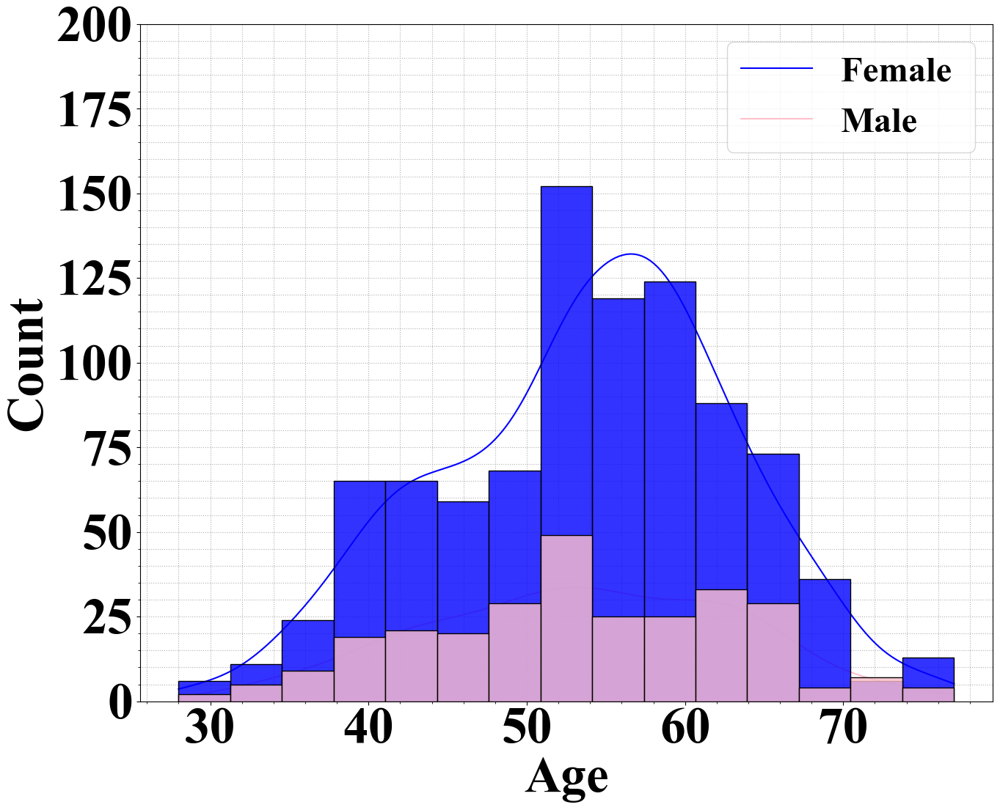

In [12]:
# Plot histogram of Age grouped by Gender
plt.figure(figsize=(15,12))
sns.histplot(data=df, x="age", hue="sex", bins=15, kde=True, palette={0: "pink", 1: "blue"},alpha=0.8,zorder=3)

# Add labels and title
plt.xlabel("Age", fontsize=50,fontweight='bold')
plt.ylabel("Count", fontsize=50,fontweight='bold')

plt.xticks(fontsize=50,fontweight='bold')
plt.yticks(fontsize=50,fontweight='bold')
plt.legend(labels=["Female ", "Male"],prop={'size':35,'weight':'bold'})
plt.grid(axis='both',which='both',linestyle='dotted',lw=0.8)
plt.minorticks_on()
plt.ylim(0,200)
#plt.savefig('Results/age_distribution.jpeg',dpi=2000,format='jpeg',bbox_inches='tight')
# Show plot
plt.show()

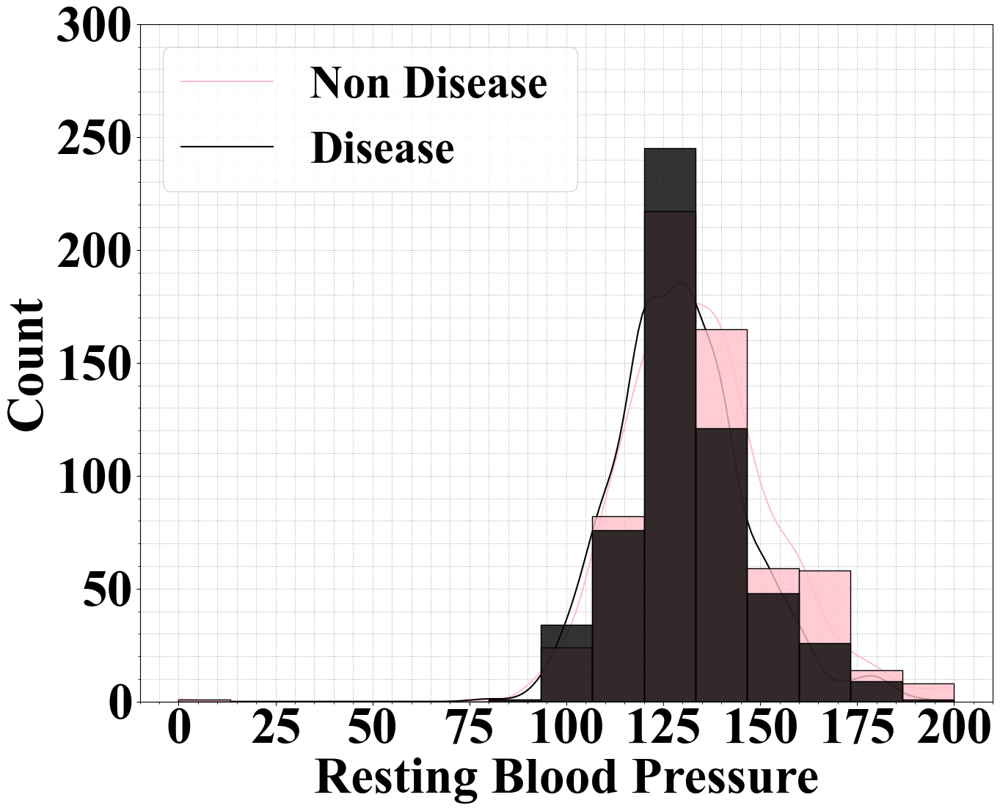

In [15]:
# Plot histogram of Age grouped by Gender
plt.figure(figsize=(15,12))
sns.histplot(data=df, x="resting bp s", hue="target", bins=15, kde=True, palette={1: "pink", 2: "blue"},alpha=0.8,zorder=3)

# Add labels and title
plt.xlabel("Resting Blood Pressure", fontsize=50,fontweight='bold')
plt.ylabel("Count", fontsize=50,fontweight='bold')

plt.xticks(fontsize=50,fontweight='bold')
plt.yticks(fontsize=50,fontweight='bold')
plt.legend(labels=["Non Disease ", "Disease"],prop={'size':45,'weight':'bold'})
plt.grid(axis='both',which='both',linestyle='dotted',lw=0.8)
plt.minorticks_on()
plt.ylim(0,300)
#plt.savefig('Results/bp_distribution.jpeg',dpi=2000,format='jpeg',bbox_inches='tight')
# Show plot
plt.show()

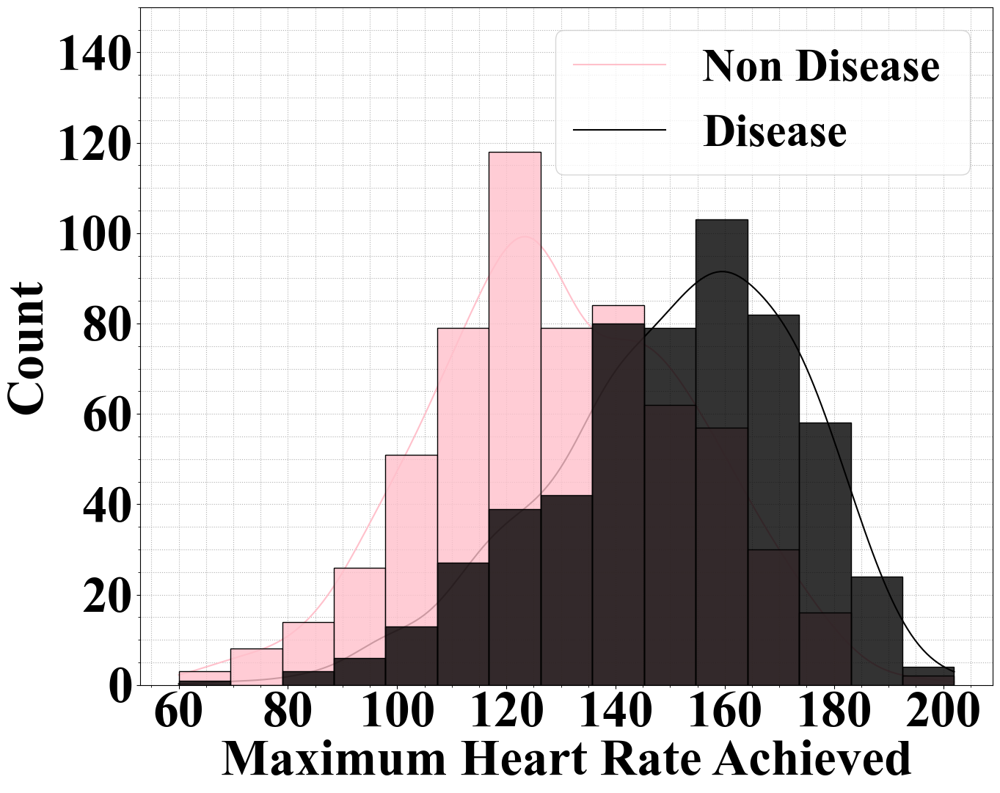

In [19]:
# Plot histogram of Age grouped by Gender
plt.figure(figsize=(15,12))
sns.histplot(data=df, x='max heart rate', hue="target", bins=15, kde=True, palette={1: "pink", 2: "blue"},alpha=0.8,zorder=3)

# Add labels and title
plt.xlabel("Maximum Heart Rate Achieved", fontsize=50,fontweight='bold')
plt.ylabel("Count", fontsize=50,fontweight='bold')

plt.xticks(fontsize=50,fontweight='bold')
plt.yticks(fontsize=50,fontweight='bold')
plt.legend(labels=["Non Disease ", "Disease"],prop={'size':45,'weight':'bold'})
plt.grid(axis='both',which='both',linestyle='dotted',lw=0.8)
plt.minorticks_on()
plt.ylim(0,150)
#plt.savefig('Results/max_heart_rate_distribution.jpeg',dpi=2000,format='jpeg',bbox_inches='tight')
# Show plot
plt.show()

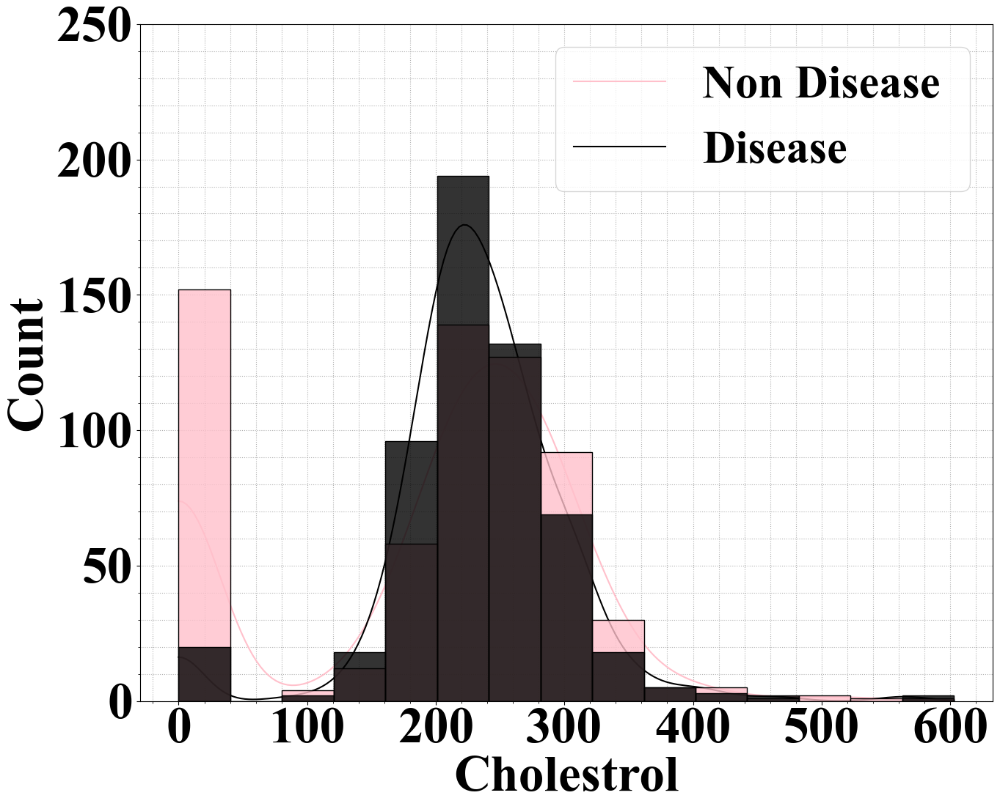

In [23]:
# Plot histogram of Age grouped by Gender
plt.figure(figsize=(15,12))
sns.histplot(data=df, x='cholesterol', hue="target", bins=15, kde=True, palette={1: "pink", 2: "blue"},alpha=0.8,zorder=3)

# Add labels and title
plt.xlabel("Cholestrol", fontsize=50,fontweight='bold')
plt.ylabel("Count", fontsize=50,fontweight='bold')

plt.xticks(fontsize=50,fontweight='bold')
plt.yticks(fontsize=50,fontweight='bold')
plt.legend(labels=["Non Disease ", "Disease"],prop={'size':45,'weight':'bold'})
plt.grid(axis='both',which='both',linestyle='dotted',lw=0.8)
plt.minorticks_on()
plt.ylim(0,250)
#plt.savefig('Results/cholestrol_distribution.jpeg',dpi=2000,format='jpeg',bbox_inches='tight')
# Show plot
plt.show()

target
1    629
0    561
Name: count, dtype: int64


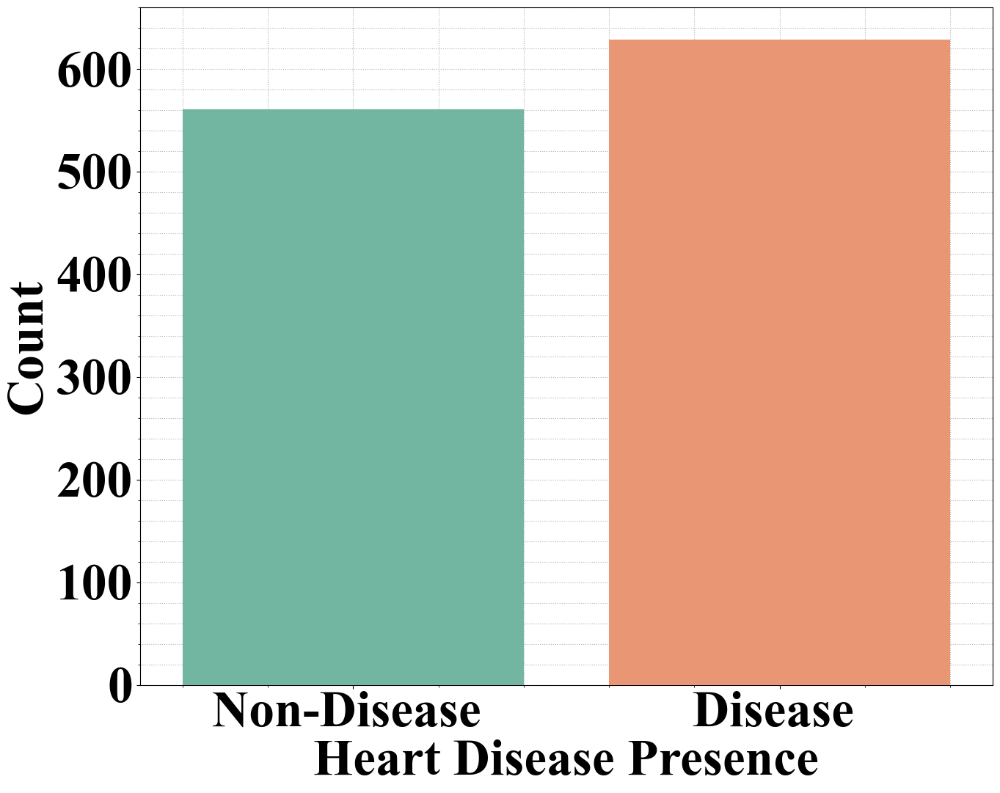

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

# Count the occurrences of each class in 'presence'
print(df["target"].value_counts())

# Plot the count of each class
plt.figure(figsize=(15,12))
ax = sns.countplot(x=df["target"], palette="Set2",zorder=3)

# Update x-axis labels
ax.set_xticklabels(["Non-Disease ", "Disease "])

# Labels and title
plt.xlabel("Heart Disease Presence", fontsize=50,fontweight='bold')
plt.ylabel("Count", fontsize=50,fontweight='bold')
plt.xticks(fontsize=50,fontweight='bold')
plt.yticks(fontsize=50,fontweight='bold')
plt.grid(axis='both',which='both',linestyle='dotted',lw=0.8)
plt.minorticks_on()
#plt.savefig('Results/target_distribution.jpeg',dpi=2000,format='jpeg',bbox_inches='tight')
# Show the plot
plt.show()


## Splitting Independent and Dependant Variables

In [26]:
X=df.drop(['target'],axis=1)
y=df['target']


## Preprocessing

In [27]:
def dynamic_gaussian_piecewise_normalization(X):
    """
    Perform Dynamic Gaussian Piecewise Normalization
    """
    normalized_df = X.copy()
    for col in X.columns:
        if X[col].dtype in ['int64', 'float64'] and col != 'target':
            mean = X[col].mean()
            std = X[col].std()
            normalized_df[col] = (X[col] - mean) / std
            
            # Handle outliers
            normalized_df[col] = np.where(
                normalized_df[col] > 3, 3,
                np.where(normalized_df[col] < -3, -3, normalized_df[col])
            )
    return normalized_df

In [28]:
X_normalized= dynamic_gaussian_piecewise_normalization(X)

In [29]:
X_normalized

,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope
0,-1.466111,0.555762,-1.317797,0.427149,0.775348,-0.520711,-0.802335,1.264507,-0.794885,-0.849435,-1.022787
1,-0.504388,-1.797820,-0.248827,1.515950,-0.299386,-0.520711,-0.802335,0.637490,-0.794885,0.071089,0.615324
2,-1.786686,0.555762,-1.317797,-0.117252,0.716188,-0.520711,0.346616,-1.635448,-0.794885,-0.849435,-1.022787
3,-0.611246,-1.797820,0.820142,0.318269,0.035852,-0.520711,-0.802335,-1.243562,1.256987,0.531351,0.615324
4,0.029902,0.555762,-0.248827,0.971549,-0.151487,-0.520711,-0.802335,-0.694922,-0.794885,-0.849435,-1.022787
...,...,...,...,...,...,...,...,...,...,...,...
1185,-0.931821,0.555762,-2.386766,-1.206053,0.528849,-0.520711,-0.802335,-0.303036,-0.794885,0.255194,0.615324
1186,1.525916,0.555762,0.820142,0.644909,-0.171207,1.918839,-0.802335,0.049661,-0.794885,2.280348,0.615324
1187,0.350477,0.555762,0.820142,-0.117252,-0.782523,-0.520711,-0.802335,-0.969242,1.256987,0.255194,0.615324
1188,0.350477,-1.797820,-1.317797,-0.117252,0.252771,-0.520711,1.495568,1.342884,-0.794885,-0.849435,0.615324


## Train Test Split

In [30]:
X_train, X_test, y_train, y_test=train_test_split(X_normalized,y,test_size=0.2,random_state=42)

In [31]:
# tf.keras.utils.to_categorical

## Model Building

In [ ]:


def squeeze_excitation_block(filters, reduction_ratio=2):
    return [
        tf.keras.layers.GlobalAveragePooling1D(),
        tf.keras.layers.Dense(filters // reduction_ratio, activation='relu'),
        tf.keras.layers.Dense(filters, activation='sigmoid')
    ]

class CapsuleSEResidualTriLSTM(tf.keras.Model):
    def __init__(self, input_dim, hidden_dim):
        super(CapsuleSEResidualTriLSTM, self).__init__()
        self.lstm = tf.keras.layers.LSTM(hidden_dim, return_sequences=True)
        self.residual = tf.keras.layers.Dense(hidden_dim)
        self.fc = tf.keras.layers.Dense(1, activation='sigmoid')  # Binary classification
        
        # Squeeze-Excitation block layers
        self.se_pool = tf.keras.layers.GlobalAveragePooling1D()
        self.se_dense1 = tf.keras.layers.Dense(hidden_dim // 2, activation='relu')
        self.se_dense2 = tf.keras.layers.Dense(hidden_dim, activation='sigmoid')
    
    def call(self, inputs):
        h = self.lstm(inputs)
        
        # Squeeze-Excitation block
        se = self.se_pool(h)
        se = self.se_dense1(se)
        se = self.se_dense2(se)
        se = tf.expand_dims(se, axis=1)
        h = tf.keras.layers.Multiply()([h, se])
        
        h += self.residual(inputs)  # Residual Connection
        h = self.fc(h[:, -1, :])
        return h

def evaluate_model(model, X, y):
    y_pred_probs = model.predict(X)
    y_pred = (y_pred_probs > 0.5).astype(int)
    
    accuracy = accuracy_score(y, y_pred)
    precision = precision_score(y, y_pred)
    recall = recall_score(y, y_pred)
    f1 = f1_score(y, y_pred)
    
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1 Score: {f1:.4f}')
    
    return accuracy, precision, recall, f1

def train_model(X_train, y_train, X_test, y_test):
    input_dim = X_train.shape[1]
    hidden_dim = 64
    
    model = CapsuleSEResidualTriLSTM(input_dim, hidden_dim)
    model.build(input_shape=(None, X_train.shape[1], 1))
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
    
    X_train_tensor = tf.expand_dims(tf.convert_to_tensor(X_train, dtype=tf.float32), axis=-1)
    y_train_tensor = tf.convert_to_tensor(y_train, dtype=tf.float32)
    X_test_tensor = tf.expand_dims(tf.convert_to_tensor(X_test, dtype=tf.float32), axis=-1)
    y_test_tensor = tf.convert_to_tensor(y_test, dtype=tf.float32)

    # Save training history to CSV
    csv_logger = tf.keras.callbacks.CSVLogger("Results/csv_files/training_history.csv", append=True)

    model.fit(X_train_tensor, y_train_tensor, epochs=150, batch_size=32, verbose=1, 
              validation_data=(X_test_tensor, y_test_tensor))
    
    print("Evaluating on Training Data:")
    train_metrics = evaluate_model(model, X_train_tensor, y_train)
    
    print("Evaluating on Test Data:")
    test_metrics = evaluate_model(model, X_test_tensor, y_test)

    # Save performance metrics
    performance_data = pd.DataFrame([{
        'Accuracy': train_metrics[0],
        'Precision': train_metrics[1],
        'Recall': train_metrics[2],
        'F1 Score': train_metrics[3]
    }])
    #performance_data.to_csv("Results/csv_files/performance_metrics.csv", index=False)
    
   # Save Predictions
    y_pred_probs = model.predict(X_train_tensor)
    y_pred = (y_pred_probs > 0.5).astype(int)

    predictions_df = pd.DataFrame({
    'Actual': y_train.values.flatten(),  # Convert Series to NumPy array first
    'Prediction': y_pred.flatten()
})
    #predictions_df.to_csv("Results/csv_files/predictions.csv", index=False)
    
    return model, X_test_tensor, y_test_tensor, train_metrics, test_metrics


In [48]:
print("Unique values in y_train:", np.unique(y_train))


Unique values in y_train: [0 1]


In [49]:
# Train and Evaluate on  Dataset
model, X_test_tensor, y_test_tensor, train_metrics, test_metrics = train_model(X_train, y_train, X_test, y_test)

# Print Train and Test Metrics
print("\n Dataset Performance:")
print(f"Train Metrics - Accuracy: {train_metrics[0]:.4f}, Precision: {train_metrics[1]:.4f}, Recall: {train_metrics[2]:.4f}, F1 Score: {train_metrics[3]:.4f}")
print(f"Test Metrics - Accuracy: {test_metrics[0]:.4f}, Precision: {test_metrics[1]:.4f}, Recall: {test_metrics[2]:.4f}, F1 Score: {test_metrics[3]:.4f}")


Epoch 1/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - accuracy: 0.7715 - loss: 0.6251 - val_accuracy: 0.7941 - val_loss: 0.5202
Epoch 2/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.8058 - loss: 0.4908 - val_accuracy: 0.7815 - val_loss: 0.4759
Epoch 3/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7975 - loss: 0.4806 - val_accuracy: 0.7899 - val_loss: 0.4755
Epoch 4/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.8070 - loss: 0.4468 - val_accuracy: 0.7857 - val_loss: 0.4768
Epoch 5/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.7949 - loss: 0.4794 - val_accuracy: 0.7899 - val_loss: 0.4744
Epoch 6/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7779 - loss: 0.4729 - val_accuracy: 0.7857 - val_loss: 0.4795
Epoch 7/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8046 - loss: 0.4593 - val_accuracy: 0.7941 - val_loss: 0.4734
Epoch 8/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8008 - loss: 0.4755 - val_accuracy: 0.

## Encrypted in Blockchain

In [50]:
import pandas as pd
pred_df=pd.read_csv('Results/csv_files/predictions.csv')
pred_df

,Actual,Prediction
0,1,1
1,0,0
2,1,1
3,1,1
4,0,0
...,...,...
947,1,1
948,0,0
949,1,1
950,1,1


In [51]:
import hashlib
from cryptography.fernet import Fernet
import pandas as pd
import time

# Generate symmetric encryption key
symmetric_key = Fernet.generate_key()
cipher_suite = Fernet(symmetric_key)

def quantum_hash(data):
    return hashlib.sha256(str(data).encode()).hexdigest()

def newton_raphson_key(attribute):
    x0 = 1.0  # Initial guess
    for _ in range(5):
        x0 = x0 - (x0**2 - attribute) / (2 * x0 + 1e-6)
    return abs(x0)

def abe_encrypt(data, attribute):
    key = newton_raphson_key(attribute)
    hashed_key = quantum_hash(key)
    encrypted = hashlib.sha256((str(data) + hashed_key).encode()).hexdigest()
    return encrypted

def abe_decrypt(encrypted_data, attribute):
    key = newton_raphson_key(attribute)
    hashed_key = quantum_hash(key)
    decrypted = hashlib.sha256(hashed_key.encode()).hexdigest()
    return decrypted

# Performance Evaluation
start_time = time.time()
pred_df['Encrypted_Actual'] = pred_df['Actual'].apply(lambda x: abe_encrypt(x, attribute=2))
pred_df['Encrypted_Predicted'] = pred_df['Prediction'].apply(lambda x: abe_encrypt(x, attribute=3))
encryption_time = time.time() - start_time

start_time = time.time()
pred_df['Decrypted_Actual'] = pred_df['Encrypted_Actual'].apply(lambda x: abe_decrypt(x, attribute=2))
decryption_time = time.time() - start_time

pred_df['Hashed_Actual'] = pred_df['Actual'].apply(quantum_hash)
pred_df['Hashed_Predicted'] = pred_df['Prediction'].apply(quantum_hash)

# Hash Collision Analysis
hashed_values = pred_df['Hashed_Actual'].tolist() + pred_df['Hashed_Predicted'].tolist()
collisions = len(hashed_values) - len(set(hashed_values))

# Encryption Strength Analysis
encryption_lengths = pred_df['Encrypted_Actual'].apply(len).unique()

print("\nUpdated DataFrame with Encrypted and Hashed Values:")
print(pred_df)

print("\n--- Performance Metrics ---")
print(f"Encryption Time: {encryption_time:.6f} seconds")
print(f"Decryption Time: {decryption_time:.6f} seconds")
print(f"Number of Hash Collisions: {collisions}")
print(f"Unique Encryption Lengths: {encryption_lengths}")

# Scalability Test:
import numpy as np


start_time = time.time()
pred_df['Encrypted_Actual'] = pred_df['Actual'].apply(lambda x: abe_encrypt(x, attribute=2))
scalability_time = time.time() - start_time
print(f"Scalability Test - Encryption Time: {scalability_time:.6f} seconds")


Updated DataFrame with Encrypted and Hashed Values:
     Actual  Prediction                                   Encrypted_Actual  \
0         1           1  bab44a197b34009d7a1000f5ee092f9a6d503ead32e26b...   
1         0           0  5e1edf84fe2c19b1c6983689f03d3a75c9a3bfc25aaf73...   
2         1           1  bab44a197b34009d7a1000f5ee092f9a6d503ead32e26b...   
3         1           1  bab44a197b34009d7a1000f5ee092f9a6d503ead32e26b...   
4         0           0  5e1edf84fe2c19b1c6983689f03d3a75c9a3bfc25aaf73...   
..      ...         ...                                                ...   
947       1           1  bab44a197b34009d7a1000f5ee092f9a6d503ead32e26b...   
948       0           0  5e1edf84fe2c19b1c6983689f03d3a75c9a3bfc25aaf73...   
949       1           1  bab44a197b34009d7a1000f5ee092f9a6d503ead32e26b...   
950       1           1  bab44a197b34009d7a1000f5ee092f9a6d503ead32e26b...   
951       0           0  5e1edf84fe2c19b1c6983689f03d3a75c9a3bfc25aaf73...   

          

In [52]:
import paho.mqtt.client as mqtt
import json
import time
import pandas as pd

# MQTT Broker Details
BROKER = "test.mosquitto.org"  # Public MQTT broker
TOPIC = "iot/heart_disease/encrypted"

# Initialize MQTT Client
client = mqtt.Client()
client.connect(BROKER, 1883, 60)

# Create a list to store encrypted data for CSV
encrypted_data_list = []

# Publish encrypted data to MQTT
try:
    for index, row in pred_df.iterrows():
        encrypted_record = {
            "Encrypted_Actual": row["Encrypted_Actual"],
            "Encrypted_Predicted": row["Encrypted_Predicted"],
            "Hashed_Actual": row["Hashed_Actual"],
            "Hashed_Predicted": row["Hashed_Predicted"]
        }
        
        # Convert dictionary to JSON
        payload = json.dumps(encrypted_record)
        
        # Publish to MQTT
        client.publish(TOPIC, payload)
        
        # Append to list for CSV
        encrypted_data_list.append(encrypted_record)

        print(f"✅ Published {index+1}/{len(pred_df)}: {payload}")
        time.sleep(0.1)  # Simulating real-time data transmission

    print("\n✅ All encrypted heart disease records published to MQTT!")

    # Convert list to DataFrame and save to CSV
    encrypted_df = pd.DataFrame(encrypted_data_list)
    encrypted_df.to_csv("encrypted_heart_disease_data.csv", index=False)
    print("✅ Encrypted data saved to 'encrypted_heart_disease_data.csv'")

except KeyboardInterrupt:
    print("\n❌ Stopping Publisher")
finally:
    client.disconnect()


✅ Published 1/952: {"Encrypted_Actual": "bab44a197b34009d7a1000f5ee092f9a6d503ead32e26b23d4545c52950c5ccc", "Encrypted_Predicted": "4c81e2064d591f81faf6851800a1f406d5e7840d75caecf002a352312a915700", "Hashed_Actual": "6b86b273ff34fce19d6b804eff5a3f5747ada4eaa22f1d49c01e52ddb7875b4b", "Hashed_Predicted": "6b86b273ff34fce19d6b804eff5a3f5747ada4eaa22f1d49c01e52ddb7875b4b"}
✅ Published 2/952: {"Encrypted_Actual": "5e1edf84fe2c19b1c6983689f03d3a75c9a3bfc25aaf73bd3b5070e1e17f56e9", "Encrypted_Predicted": "f5aa1c018f3051bfdec7c166ddcc6d5a9c9a64635e02fbf30c64d0576100d4fd", "Hashed_Actual": "5feceb66ffc86f38d952786c6d696c79c2dbc239dd4e91b46729d73a27fb57e9", "Hashed_Predicted": "5feceb66ffc86f38d952786c6d696c79c2dbc239dd4e91b46729d73a27fb57e9"}
✅ Published 3/952: {"Encrypted_Actual": "bab44a197b34009d7a1000f5ee092f9a6d503ead32e26b23d4545c52950c5ccc", "Encrypted_Predicted": "4c81e2064d591f81faf6851800a1f406d5e7840d75caecf002a352312a915700", "Hashed_Actual": "6b86b273ff34fce19d6b804eff5a3f5747ada4e

## Evaluation Results


In [53]:
pred_df=pd.read_csv('Results/csv_files/predictions.csv')
pred_df

,Actual,Prediction
0,1,1
1,0,0
2,1,1
3,1,1
4,0,0
...,...,...
947,1,1
948,0,0
949,1,1
950,1,1


In [54]:
y_true=pred_df['Actual'].values
y_true

array([1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1,
       0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1,
       1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1,
       0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0,
       1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1,
       0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1,
       1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0,

In [55]:
y_pred=pred_df['Prediction'].values
y_pred

array([1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1,
       0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1,
       1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1,
       0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0,
       1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1,
       0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1,
       1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0,

In [56]:
print('Accuracy:',accuracy_score(y_true,y_pred))
print('Precision:',precision_score(y_true,y_pred))
print('Recall:',recall_score(y_true,y_pred))
print('F1 Score:',f1_score(y_true,y_pred))

Accuracy: 0.9968487394957983
Precision: 0.9959919839679359
Recall: 0.9979919678714859
F1 Score: 0.9969909729187563


In [57]:
conf_mat=confusion_matrix(y_true,y_pred)
conf_mat

array([[452,   2],
       [  1, 497]], dtype=int64)

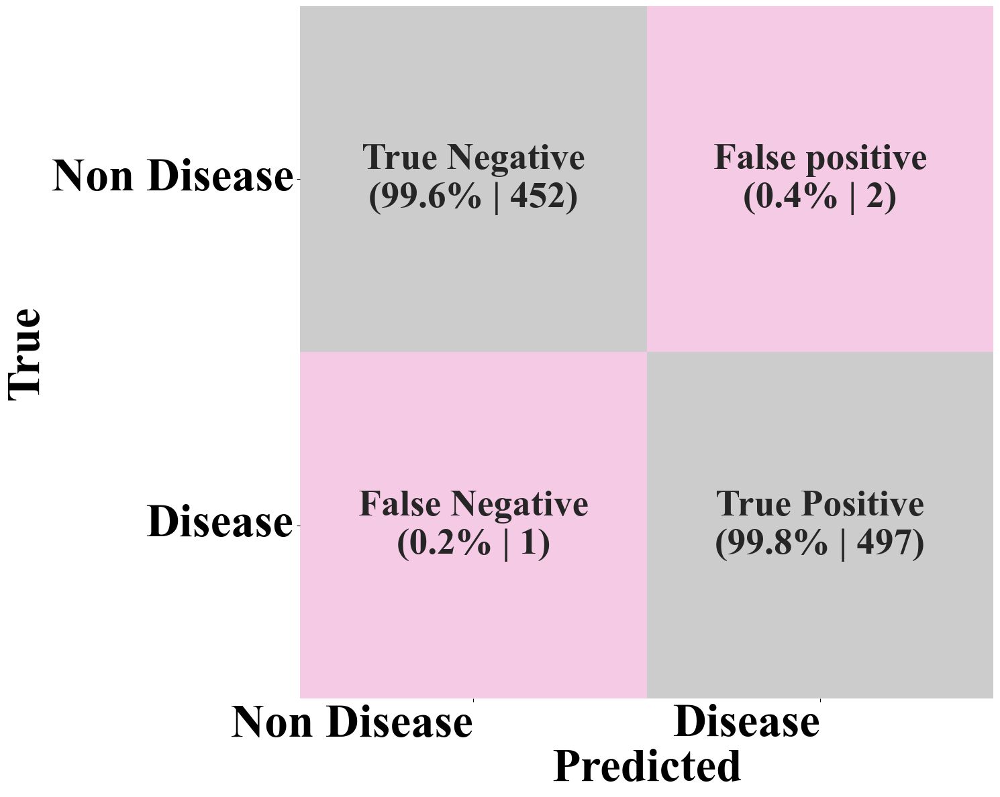

In [59]:
# Compute percentage values
CM_percent = conf_mat.astype('float') / conf_mat.sum(axis=1)[:, np.newaxis] * 100

# Define labels for TP, FP, FN, TN
labels = np.array([["True Negative\n({0:.1f}% | {1})".format(CM_percent[0,0], conf_mat[0,0]),  
                     "False positive\n({0:.1f}% | {1})".format(CM_percent[0,1], conf_mat[0,1])],
                   ["False Negative\n({0:.1f}% | {1})".format(CM_percent[1,0], conf_mat[1,0]),  
                    "True Positive\n({0:.1f}% | {1})".format(CM_percent[1,1], conf_mat[1,1])]])

# Plot the confusion matrix
plt.figure(figsize=(15, 12))
heatmap = sns.heatmap(
    CM_percent, 
    fmt='', annot=labels, cmap='Pastel2', cbar=False, center=True,
    xticklabels=['Non Disease', 'Disease'], yticklabels=['Non Disease', 'Disease'],
    annot_kws={"size": 40, "weight": "bold"}  # Adjust annotation size
)

# Add labels and title
plt.xlabel('Predicted', fontsize=50, fontweight='bold')
plt.ylabel('True', fontsize=50, fontweight='bold')

plt.xticks(fontsize=50, fontweight='bold', ha='right')  # Rotate x-axis labels
plt.yticks(fontsize=50, fontweight='bold', rotation=0)

# Show the plot
plt.tight_layout()
#plt.savefig('Results/confusion_matrix.jpeg', dpi=2000, bbox_inches='tight', format='jpeg')
plt.show()

In [60]:
y_scores = y_pred * 0.9 + (1 - y_pred) * 0.1  # 

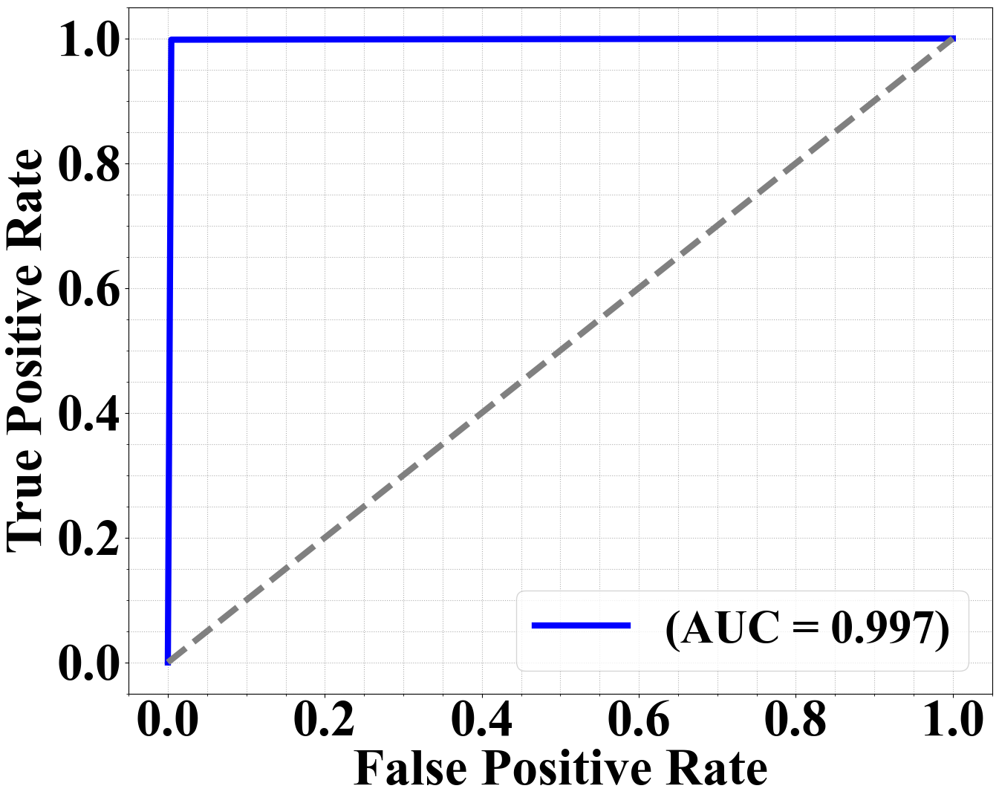

In [64]:
# Compute ROC curve and AUC
fpr, tpr, _ = roc_curve(y_true, y_scores)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(15,12))
plt.plot(fpr, tpr, color='blue', lw=6, label=f'(AUC = {roc_auc:.3f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--',lw=6)  # Diagonal line

plt.xlabel('False Positive Rate', fontsize=50,fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=50,fontweight='bold')
plt.legend(loc='lower right', prop={'size':45,'weight':'bold'})
plt.xticks(fontsize=50,fontweight='bold')
plt.yticks(fontsize=50,fontweight='bold')
plt.grid(axis='both',which='both',linestyle='dotted',lw=0.8)
plt.minorticks_on()
#plt.savefig('Results/roc_curve.jpeg',dpi=2000,format='jpeg',bbox_inches='tight')
plt.show()

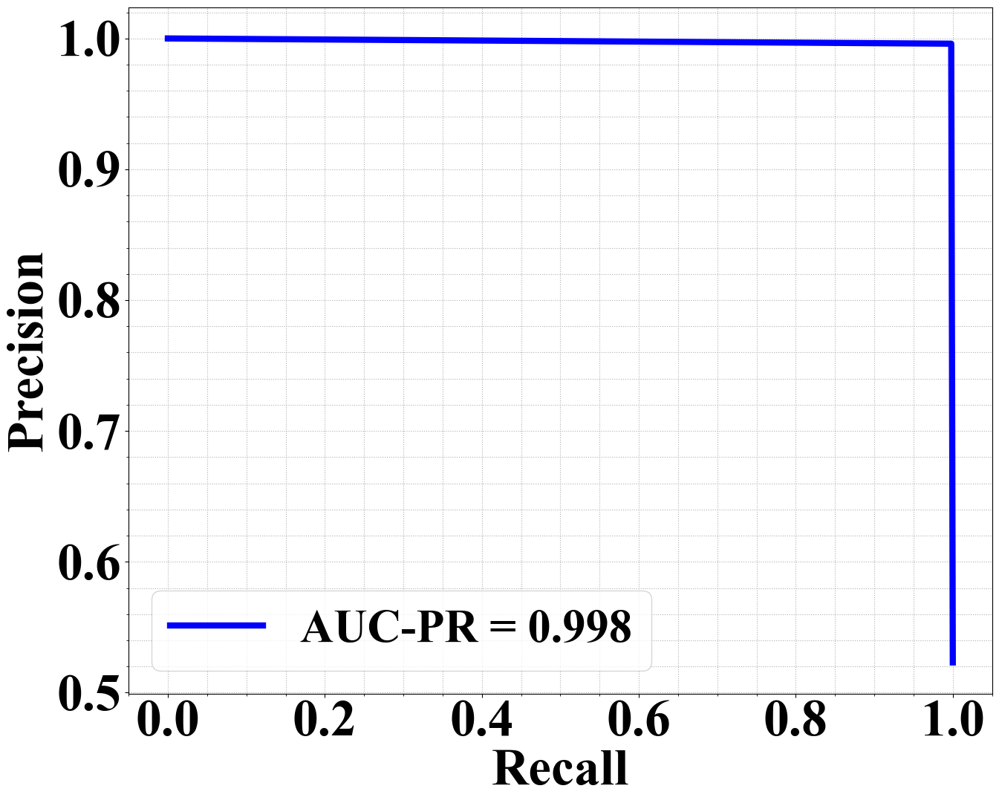

In [66]:

from sklearn.metrics import precision_recall_curve
# Compute precision-recall curve
precision, recall, _ = precision_recall_curve(y_true, y_scores)

# Compute AUC-PR
pr_auc = auc(recall, precision)

# Plot PR curve
plt.figure(figsize=(15,12))
plt.plot(recall, precision, color='blue', linewidth=6, label=f'AUC-PR = {pr_auc:.3f}')
plt.xlabel('Recall', fontsize=50, fontweight='bold')
plt.ylabel('Precision', fontsize=50, fontweight='bold')
plt.legend(loc='lower left', prop={'size':45,'weight':'bold'})
plt.xticks(fontsize=50,fontweight='bold')
plt.yticks(fontsize=50,fontweight='bold')
plt.grid(axis='both',which='both',linestyle='dotted',lw=0.8)
plt.minorticks_on()
#plt.savefig('Results/precision_recall_curve.jpeg',dpi=2000,format='jpeg',bbox_inches='tight')
plt.show()

In [67]:
metrics_df=pd.read_csv('Results/csv_files/training_history.csv')
metrics_df

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.788866,0.588817,0.794118,0.520165
1,1,0.782563,0.487259,0.781513,0.475854
2,2,0.789916,0.473780,0.789916,0.475478
3,3,0.799370,0.472219,0.785714,0.476791
4,4,0.799370,0.470341,0.789916,0.474428
...,...,...,...,...,...
145,145,0.970588,0.080474,0.915966,0.339692
146,146,0.990546,0.040548,0.890756,0.384953
147,147,0.992647,0.033619,0.903361,0.362778
148,148,0.995798,0.028373,0.920168,0.343317


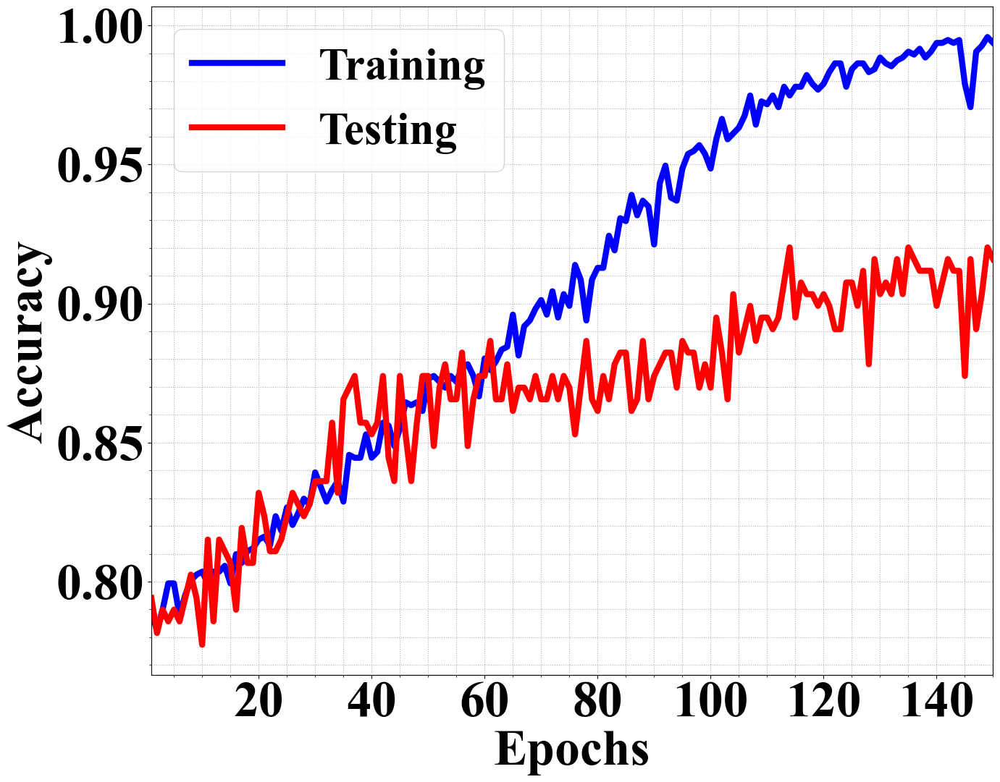

In [69]:
plt.figure(figsize=(15,12))
plt.plot(np.arange(1,151),metrics_df['accuracy'], color='blue', linewidth=6, label='Training')
plt.plot(np.arange(1,151),metrics_df['val_accuracy'], color='red', linewidth=6, label='Testing')

plt.xlabel('Epochs', fontsize=50, fontweight='bold')
plt.ylabel('Accuracy', fontsize=50, fontweight='bold')
plt.legend(prop={'size':45,'weight':'bold'})
plt.xticks(fontsize=50,fontweight='bold')
plt.yticks(fontsize=50,fontweight='bold')
plt.grid(axis='both',which='both',linestyle='dotted',lw=0.8)
plt.minorticks_on()
plt.xlim(1,150)
#plt.savefig('Results/accuracy_curve.jpeg',dpi=2000,format='jpeg',bbox_inches='tight')

plt.show()

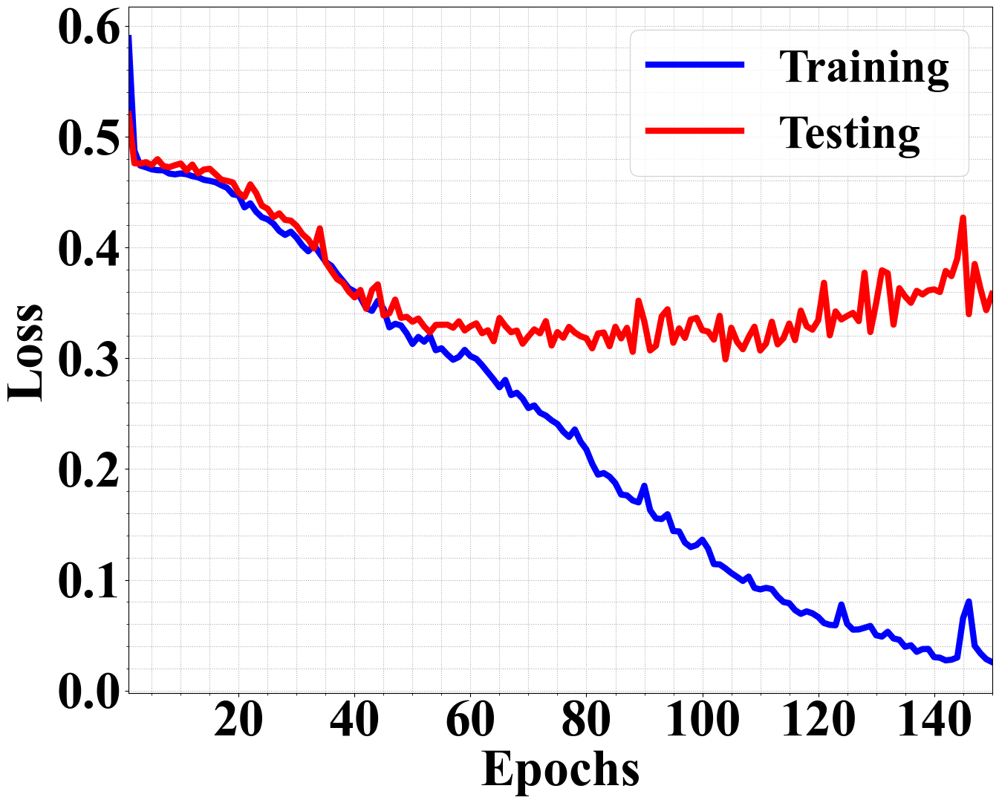

In [71]:
plt.figure(figsize=(15,12))
plt.plot(np.arange(1,151),metrics_df['loss'], color='blue', linewidth=6, label='Training')
plt.plot(np.arange(1,151),metrics_df['val_loss'], color='red', linewidth=6, label='Testing')

plt.xlabel('Epochs', fontsize=50, fontweight='bold')
plt.ylabel('Loss', fontsize=50, fontweight='bold')
plt.legend(prop={'size':45,'weight':'bold'})
plt.xticks(fontsize=50,fontweight='bold')
plt.yticks(fontsize=50,fontweight='bold')
plt.grid(axis='both',which='both',linestyle='dotted',lw=0.8)
plt.minorticks_on()
plt.xlim(1,150)
#plt.savefig('Results/loss_curve.jpeg',dpi=2000,format='jpeg',bbox_inches='tight')

plt.show()

## Finally the project folder will be saved into Cloud(Google drive)

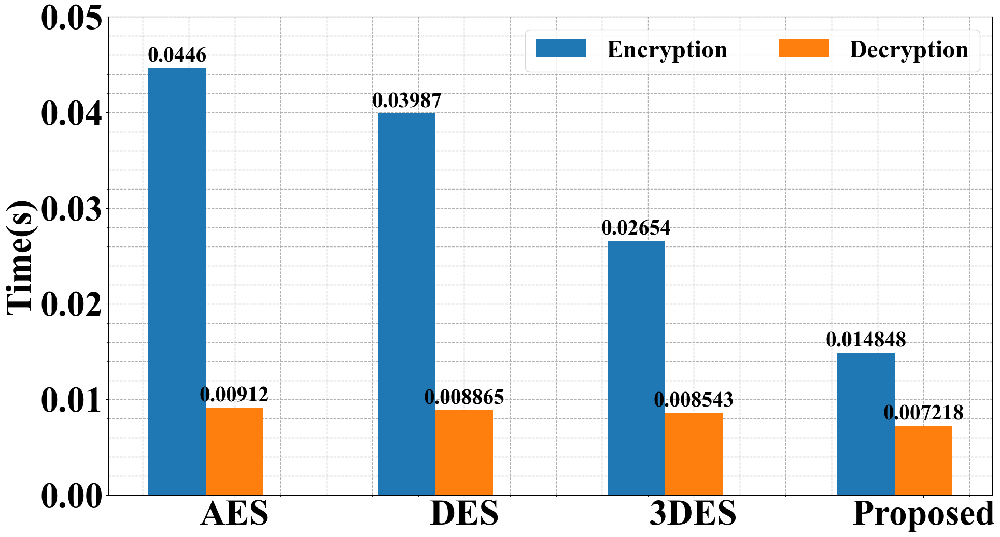

In [16]:
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams['font.family'] = "Times New Roman"

species = ("AES", "DES", "3DES", "Proposed")
penguin_means = {
    'Encryption': (0.0446, 0.03987, 0.02654, 0.014848),
    'Decryption': (0.00912, 0.008865, 0.008543, 0.007218)
}

x = np.arange(len(species))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(22, 12))

for attribute, measurement in penguin_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, zorder=3)
    ax.bar_label(rects, padding=3, fontsize=30, fontweight='bold')  # <-- updated here
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Time(s)', fontsize=50, fontweight='bold')
ax.set_xticks(x + width, species)

# Font styling for axis tick labels
for ticks in ax.get_xticklabels():
    ticks.set_fontsize(50)
    ticks.set_fontweight('bold')
for ticks in ax.get_yticklabels():
    ticks.set_fontsize(50)
    ticks.set_fontweight('bold')

# Legend and grid
ax.legend(loc='upper right', ncols=2, prop={'size': 35, 'weight': 'bold'})
ax.minorticks_on()
ax.grid(True, axis='both', which='both', linestyle='--', lw=1)
ax.set_ylim(0,0.05)
#plt.savefig('Results/encry_decry_comp.jpeg',dpi=2000,format='jpeg',bbox_inches='tight')

plt.show()


In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
plt.rcParams['font.family']="Times New Roman"
# === Performance Metrics ===
# # Accuracy: 0.9968487394957983
# Precision: 0.9959919839679359
# Recall: 0.9979919678714859
# F1 Score: 0.9969909729187563
# Updated DataFrame with 5 metrics per group
data = {
    'name': ['Accuracy', 'Precision', 'Recall', 'F1 Score'] * 4,
    'value': [
        92.56, 92.78, 92.65, 92.77,       # DCA
        92.67, 92.56, 92.79, 92.76,       # FETCH
        93.63, 94.78, 92.79, 93.76,        # DECISION MAKING
       
        99.6, 99.59, 99.79, 99.69 # (Proposed)
    ],
    'group': ['DCA'] * 4 + ['FETCH'] * 4 + ['Decision Making'] * 4 + ['Proposed'] * 4
}

df = pd.DataFrame(data)

# Extract values
VALUES = df["value"].values
LABELS = df["name"].values
GROUP = df["group"].values

# Parameters
GROUPS = np.unique(GROUP)
ANGLES_N = len(VALUES)
ANGLES = np.linspace(0, 2 * np.pi, num=ANGLES_N, endpoint=False)
WIDTH = (2 * np.pi) / len(ANGLES)
OFFSET = np.pi / 2

# Calculate indices
GROUPS_SIZE = [len(df[df["group"] == g]) for g in GROUPS]
offset = 0
IDXS = []
for size in GROUPS_SIZE:
    IDXS += list(range(offset, offset + size))
    offset += size

# Color map
color_map = {
    'DCA': 'grey',
    'FETCH': 'yellow',
    'Decision Making': 'red',
    
    'Proposed': 'blue'
}
COLORS = [color_map[group] for group in GROUP]

# Plot
fig, ax = plt.subplots(figsize=(15,12), subplot_kw={"projection": "polar"}, dpi=900)
ax.set_theta_offset(OFFSET)
ax.set_ylim(0, max(VALUES) + 10)
ax.set_frame_on(False)
ax.xaxis.grid(False)
ax.yaxis.grid(False)
ax.set_xticks([])
ax.set_yticks([])

# Bars
bars = ax.bar(
    ANGLES[IDXS], VALUES, width=WIDTH, color=COLORS,
    edgecolor="white", linewidth=2, alpha=0.8
)

# Group annotations and reference lines
offset = 0
for group, size in zip(GROUPS, GROUPS_SIZE):
    x1 = np.linspace(ANGLES[offset], ANGLES[offset + size - 1], num=50)
    ax.plot(x1, [-5] * 50, color="gray", linewidth=1.5)

    group_angle = np.mean(x1)
    ax.text(
        group_angle, -15, group, color="black", fontsize=24,
        fontweight="bold", ha="center", va="center"
    )

    for ref in [20, 40, 60, 80, 100]:
        ax.plot(x1, [ref] * 50, color="lightgray", linestyle="--", linewidth=0.8)

    offset += size

# Label bars
for angle, label, value in zip(ANGLES[IDXS], LABELS, VALUES):
    alignment = "left" if np.sin(angle - OFFSET) >= 0 else "right"
    ax.text(
        angle, value + 2,
        f'{label}',
        ha=alignment, va="center",
        fontsize=50, fontweight="bold",
        rotation=np.degrees(angle - OFFSET),
        rotation_mode="anchor",
        color='black'
    )

# Legend
legend_handles = [mpatches.Patch(color=color_map[group], label=group) for group in GROUPS]
ax.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(1.32,1.32), ncol=1, prop={'size': 38, 'weight': 'bold'})

plt.tight_layout()
#plt.savefig("Results/performance_comparison.jpeg",  dpi=2000, format="jpeg", bbox_inches="tight")

plt.show()
